<a href="https://colab.research.google.com/github/yrodriguezmd/Surgical_instruments/blob/main/project/Surg500/notebooks/Surg100_400_oct6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2021-10-06 19:23:32--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 595 [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]     595  --.-KB/s    in 0s      

2021-10-06 19:23:32 (27.1 MB/s) - ‘install_colab.sh’ saved [595/595]

- Installing mmcv
installing mmcv-full from wheel.
Looking in links: https://download.openmmlab.com/mmcv/dist/cu102/torch1.9.0/index.html
     |████████████████████████████████| 35.6 MB 9.5 MB/s 
     |████████████████████████████████| 185 kB 15.1 MB/s 
- Installing mmdet
installing mmdet from https://github.com/open-mmlab/mmdetection.git.
Cloning into '/tmp/tmpzfg_liy1/mmdetection'...
remote: Enumerating objects: 21

In [2]:
exit()

In [ ]:
import icevision

In [2]:
from icevision.all import *
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.10.0a1
torch v 1.9.0+cu102
torchvision v 0.10.0+cu102


Previous work:

Inference using fine tuned model did not give good predictions for Surg 300.

Objective:

Merge labelled Surg100_200 and Surg300, use to finetune VFnet.  Get pseudolabels for Surg400.


In [3]:
!git clone https://github.com/yrodriguezmd/Surgical_instruments.git

Cloning into 'Surgical_instruments'...
remote: Enumerating objects: 1427, done.
remote: Counting objects: 100% (147/147), done.
remote: Compressing objects: 100% (145/145), done.
remote: Total 1427 (delta 34), reused 2 (delta 2), pack-reused 1280
Receiving objects: 100% (1427/1427), 54.87 MiB | 17.92 MiB/s, done.
Resolving deltas: 100% (254/254), done.


In [5]:
# temporary Surg100_300 uploaded in Colab
!ls Surgical_instruments/project/Merged

Full  README.md  Surg100_200


Use merged Surg100_300 to finetune VFnet

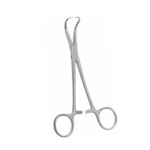

In [6]:
#image_path = Path('.')
image_path = Path('Surgical_instruments/project/Merged/Full')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[301]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [7]:
# now using actual classes, not coco
import pandas as pd
df = pd.read_csv('Surgical_instruments/project/Merged/Surg100_200/_annotations.csv')
df.rename(columns = {'class':'label'},inplace=True)
classes = df.label.unique().tolist()
class_map = ClassMap(classes) ## resolved pickle error
len(class_map)

16

In [ ]:
## temporary
#parser = parsers.COCOBBoxParser(
#    annotations_filepath = Path('./_annotations_300.coco.json'),
#    img_dir = Path('.', mask=False))

In [8]:
parser = parsers.COCOBBoxParser(
    annotations_filepath = Path('./Surgical_instruments/project/Merged/Full/_annotations_400.coco.json'),
    img_dir = Path('./Surgical_instruments/project/Merged/Full/', mask=False))

In [9]:
train_records, valid_records = parser.parse()

  0%|          | 0/561 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/381 [00:00<?, ?it/s]

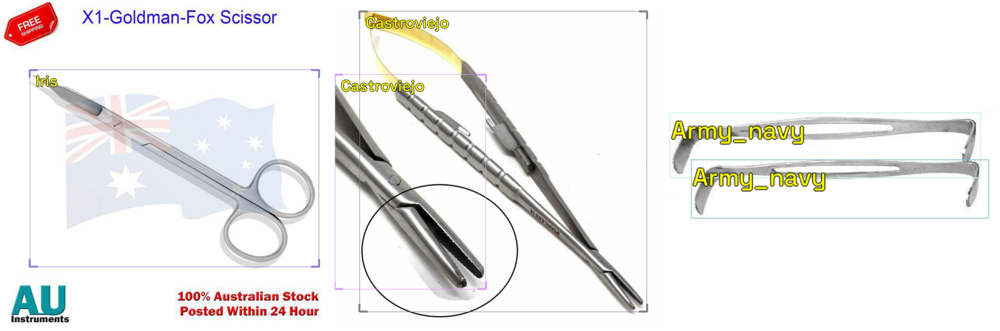

In [10]:
show_records(train_records[300:303],ncols=3, font_size=30, label_color = '#ffff00')

Fine tune VFnet using Surg100_400

In [11]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [12]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

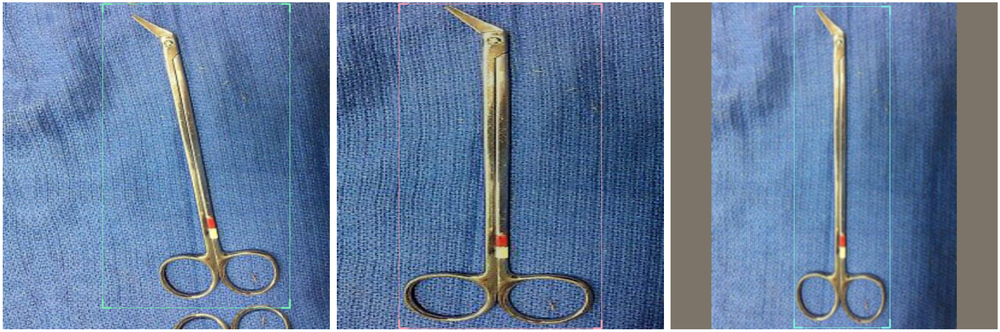

In [13]:
samples = [train_ds[6] for _ in range(3)]
show_samples(samples, ncols=3, display_label=False)

In [ ]:
from icevision.models.checkpoint import *

model_type = models.mmdet.vfnet ##
backbone = model_type.backbones.resnet50_fpn_mstrain_2x##

model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(classes),)# **extra_args) 

In [15]:
backbone.__dict__

{'config_path': Path('/root/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs/vfnet/vfnet_r50_fpn_mstrain_2x_coco.py'),
 'model_name': 'vfnet',
 'pretrained': True,
 'weights_url': 'https://openmmlab.oss-cn-hangzhou.aliyuncs.com/mmdetection/v2.0/vfnet/vfnet_r50_fpn_mstrain_2x_coco/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth'}

In [16]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [17]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=0.002511886414140463)

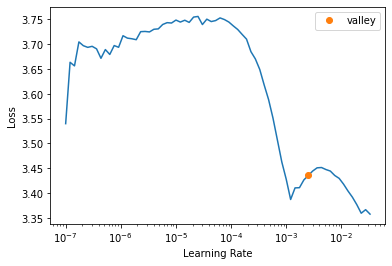

In [18]:
learn.lr_find()

In [19]:
learn.fine_tune(20, 0.002511886414140463)

epoch,train_loss,valid_loss,COCOMetric,time
0,3.118478,3.220340,0.000000,00:23


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,2.430990,2.286866,0.069325,00:23
1,2.198859,2.172928,0.083139,00:23
2,2.106982,2.134830,0.111621,00:23
3,2.069288,2.152781,0.103472,00:23
4,2.054754,2.148412,0.127050,00:23
5,2.015303,2.122830,0.134309,00:23
6,1.985349,2.119378,0.146640,00:23
7,1.950155,2.136631,0.136775,00:23
8,1.923724,2.035038,0.165339,00:23
9,1.887182,2.040739,0.147901,00:23


epoch,train_loss,valid_loss,COCOMetric,time
0,2.430990,2.286866,0.069325,00:23
1,2.198859,2.172928,0.083139,00:23
2,2.106982,2.134830,0.111621,00:23
3,2.069288,2.152781,0.103472,00:23
4,2.054754,2.148412,0.127050,00:23
5,2.015303,2.122830,0.134309,00:23
6,1.985349,2.119378,0.146640,00:23
7,1.950155,2.136631,0.136775,00:23
8,1.923724,2.035038,0.165339,00:23
9,1.887182,2.040739,0.147901,00:23


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=4.365158383734524e-05)

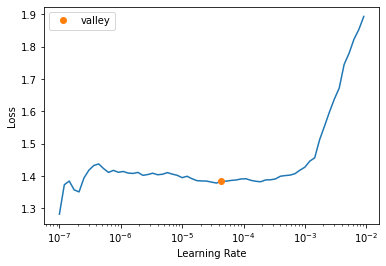

In [20]:
learn.lr_find()

In [21]:
learn.unfreeze  ## () not needed?
learn.fit_one_cycle(10, 4.365158383734524e-5,)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.363559,1.848705,0.302878,00:23
1,1.371511,1.861872,0.314823,00:23
2,1.370374,1.834229,0.311917,00:23
3,1.366288,1.887862,0.270326,00:23
4,1.361647,1.880782,0.303122,00:23
5,1.350028,1.810393,0.309765,00:23
6,1.321098,1.853353,0.311263,00:23
7,1.305330,1.834297,0.314384,00:23
8,1.296733,1.846207,0.305360,00:23
9,1.289482,1.846321,0.304934,00:23


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=9.120108734350652e-05)

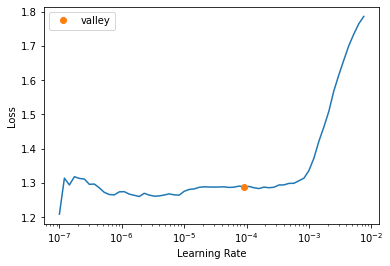

In [22]:
learn.lr_find()

In [23]:
learn.fit_one_cycle(10, 1e-4,)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.278228,1.849095,0.295287,00:23
1,1.285064,1.841599,0.336289,00:23
2,1.292801,1.929372,0.315533,00:24
3,1.306973,1.855884,0.341119,00:23
4,1.304979,1.878627,0.353771,00:23
5,1.294565,1.846981,0.324745,00:23
6,1.267372,1.908264,0.320082,00:23
7,1.235847,1.863297,0.342490,00:23
8,1.215166,1.867356,0.335717,00:23
9,1.196578,1.862844,0.337182,00:23


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=5.248074739938602e-05)

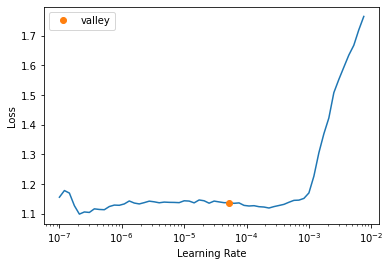

In [30]:
learn.lr_find()

In [31]:
learn.fit_one_cycle(10, 5e-5,)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.128410,1.844701,0.341083,00:23
1,1.134403,1.894908,0.343284,00:23
2,1.126166,1.876549,0.359776,00:23
3,1.141667,1.908116,0.341693,00:23
4,1.144733,1.869765,0.351984,00:23
5,1.123405,1.918288,0.332066,00:23
6,1.108363,1.908720,0.343327,00:23
7,1.092744,1.890379,0.340360,00:23
8,1.073355,1.916801,0.347557,00:23
9,1.066298,1.915294,0.348168,00:23


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=5.754399353463668e-06)

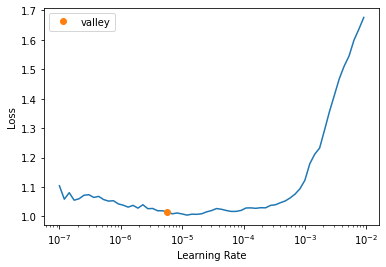

In [32]:
learn.lr_find()

In [33]:
learn.fit_one_cycle(10, 5e-5,)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.033516,1.895050,0.340754,00:23
1,1.044628,1.888667,0.344615,00:23
2,1.043108,1.993351,0.334856,00:23
3,1.050844,1.914983,0.370257,00:23
4,1.053900,1.919212,0.353811,00:23
5,1.037959,1.976641,0.338486,00:23
6,1.037290,1.920571,0.356929,00:23
7,1.022548,1.932174,0.354116,00:23
8,1.010844,1.937120,0.355299,00:23
9,0.984191,1.939382,0.354262,00:23


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


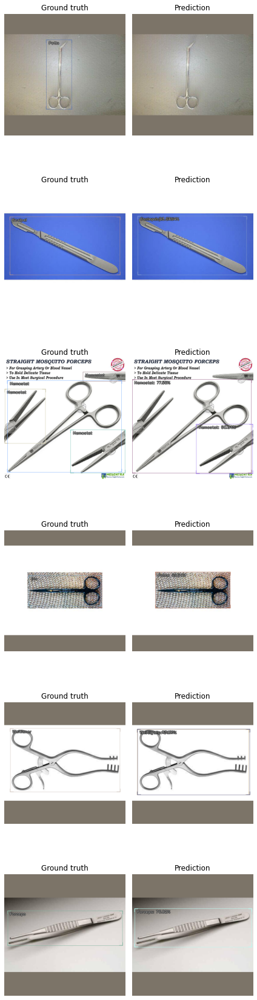

In [34]:
model_type.show_results(model, valid_ds)

Not very good mAPs.

Do inference for Surg500.

In [53]:
checkpoint_path =  'Surg100_400_mAP35'##

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet',## 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

# saved to colab files

In [43]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)
root_dir = Path('/content/gdrive/MyDrive')

Mounted at /content/gdrive


In [49]:
!ls gdrive/MyDrive/models

bccd-faster-rcnn-best.pth  Surg100_vfnet-2.pth	   wheat-mmdet_retinanet.pth
bccd-faster-rcnn.pth	   Surg100_vfnet-best.pth  wheat-yolo-best-4th.pth
plantdoc-yolov5.pth	   wheat-eff-best.pth


In [ ]:
checkpoint_and_model = model_from_checkpoint(checkpoint_path)

model = checkpoint_and_model['model']
#https://github.com/airctic/icevision/blob/9f23f35d1781fde39f7fe6935f58ef0a4a1940e0/icevision/models/checkpoint.py

Inference

In [57]:
## temporary: after loading Surg500 in github
!git clone https://github.com/yrodriguezmd/Surgical_instruments.git

fatal: destination path 'Surgical_instruments' already exists and is not an empty directory.
pilot  project	README.md


In [59]:
!ls Surgical_instruments/project/Surg500

notebooks  raw_images  Surg_500_ann_coco


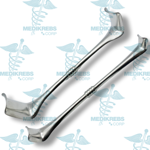

In [60]:
image_path = Path('./Surgical_instruments/project/Surg500/raw_images')
#image_path = Path('Surgical_instruments/project/Merged/Surg100_200/train')

## images better in a folder
img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[0]) ##
img = img.convert('RGB')

img.to_thumb(150,150)

In [61]:
model.eval()

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

In [62]:
# generating pseudolabels
infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True,) 
## got can't pickle error which was resolved by using ClassMap

  0%|          | 0/25 [00:00<?, ?it/s]

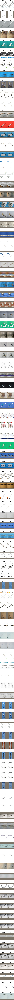

In [63]:
show_preds(preds_saved, font_size=30, label_color='#ffff00')

Results: Poor predictions.

Try rerunning with Surg100_300 inference notebook

In [ ]:
#skip if predictions not good
for pred in preds_saved:
  pred.add_component(FilepathRecordComponent())

for _ in range(len(preds_saved)): 
  preds_saved[_].set_filepath(img_files[_]) 

conv = convert_preds_to_coco_style(preds_saved) 

In [ ]:
#skip
add_info = {
    "info": {
    "description": "Surgery Instruments",
    "url": "http://cocodataset.org",
    "version": "1.0",
    "year": 2021,
    "contributor": "MR",
    "date_created": "2021/09/27"
    },
  "categories": [
                 ## adjusted to 80 classes, 
                 ## limiting categories
    {
      "supercategory": "kitchen",
      "id": 44,
      "name": "knife"
    },
    {
      "supercategory": "indoor",
      "id": 77,
      "name": "scissors"
    }
    ] }

In [ ]:
#skip
annot = {**add_info, **conv}

f = open('annot.json','w') 
f.write(str(annot)) 
f.close()
## download and adjust ' to "
#### cannot see files in Colab

### alternate: go straight to Roboflow and google mount
#from google.colab import drive
#drive.mount('/content/gdrive', force_remount = True)
#root_dir = Path('/content/gdrive/MyDrive')

In [ ]:
# temporary because colab doesn't show files
#from google.colab import files
#files.download('annot.json')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Retained codes for future use

In [ ]:
checkpoint_path = 'Surg100_vfnet.pth'

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet',## 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

In [ ]:
!ls # with Surg100_ret_b.pth

annot.json   install_colab.sh	      sample_data	 Surg100_vfnet.pth
checkpoints  models		      Surg100_ret_b.pth  Surgical_instruments
gdrive	     pilot15_for_pseudolabel  Surg100_ret.pth
http:	     pilot15_ret.pth	      Surg100_vf_b.pth


In [ ]:
checkpoint_and_model = model_from_checkpoint(checkpoint_path)

In [ ]:
# using finetune
model = checkpoint_and_model['model']
#model